In [61]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import librosa
import librosa.display
import os
from tqdm import tqdm
import IPython

Blues


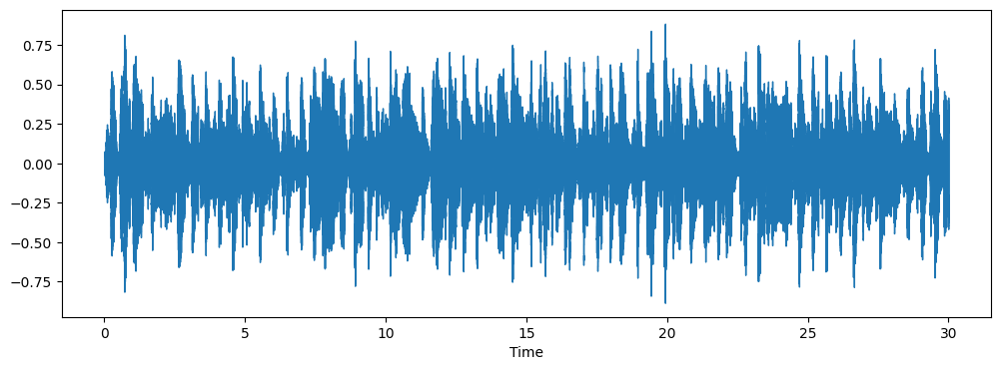

In [62]:
plt.figure(figsize=(12, 4))
y, sr = librosa.load('dataset/genres_original/blues/blues.00000.wav')
librosa.display.waveshow(y, sr=sr)

print("Blues")
IPython.display.display(IPython.display.Audio("dataset/genres_original/blues/blues.00000.wav"))

Classical


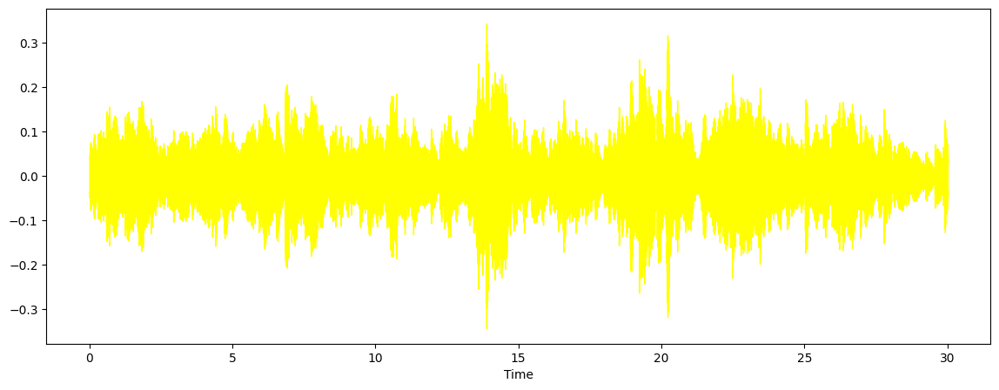

In [63]:
plt.figure(figsize=(14, 5))
x, sr = librosa.load('dataset/genres_original/classical/classical.00000.wav')
librosa.display.waveshow(x, sr=sr,color='yellow')

print("Classical")
IPython.display.display(IPython.display.Audio("dataset/genres_original/classical/classical.00000.wav"))

Country


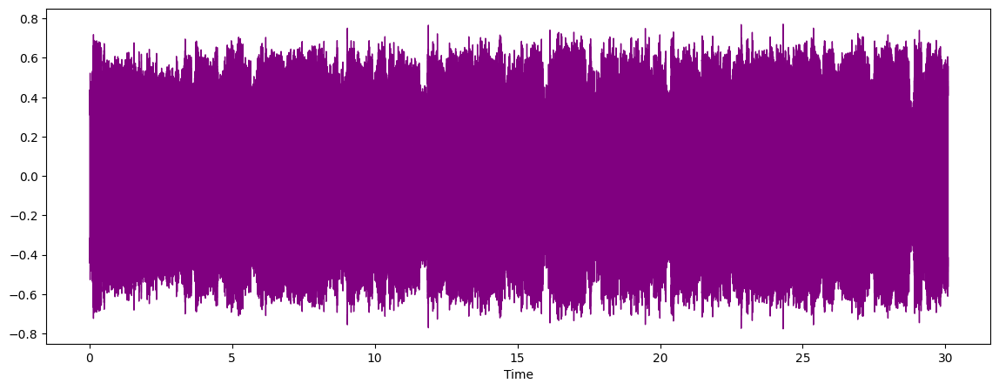

In [64]:
plt.figure(figsize=(14, 5))
x, sr = librosa.load('dataset/genres_original/country/country.00000.wav')
librosa.display.waveshow(x, sr=sr,color='purple')

print("Country")
IPython.display.display(IPython.display.Audio("dataset/genres_original/country/country.00000.wav"))

Disco


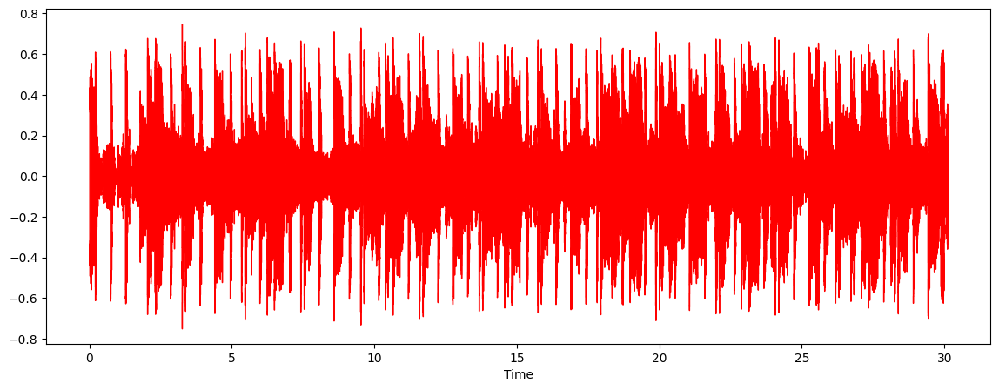

In [65]:
plt.figure(figsize=(14, 5))
x, sr = librosa.load('dataset/genres_original/disco/disco.00000.wav')
librosa.display.waveshow(x, sr=sr,color='red')

print("Disco")
IPython.display.display(IPython.display.Audio("dataset/genres_original/disco/disco.00000.wav"))

Jazz


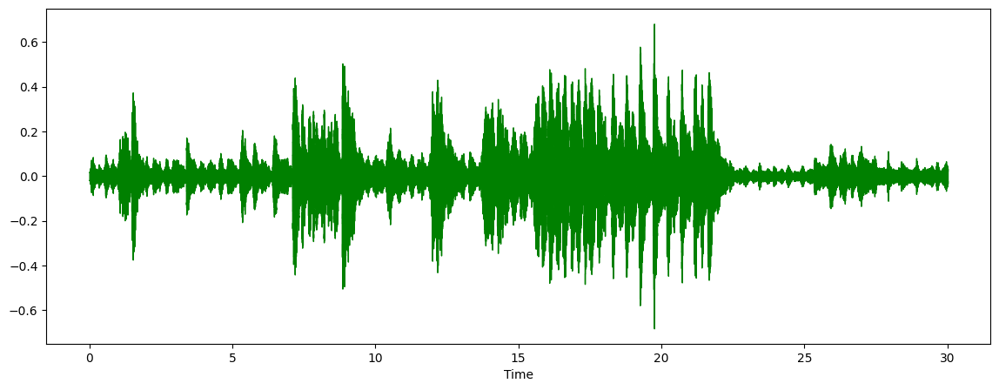

In [66]:
plt.figure(figsize=(14, 5))
x, sr = librosa.load('dataset/genres_original/jazz/jazz.00000.wav')
librosa.display.waveshow(x, sr=sr,color='green')

print("Jazz")
IPython.display.display(IPython.display.Audio("dataset/genres_original/jazz/jazz.00000.wav"))

Pop


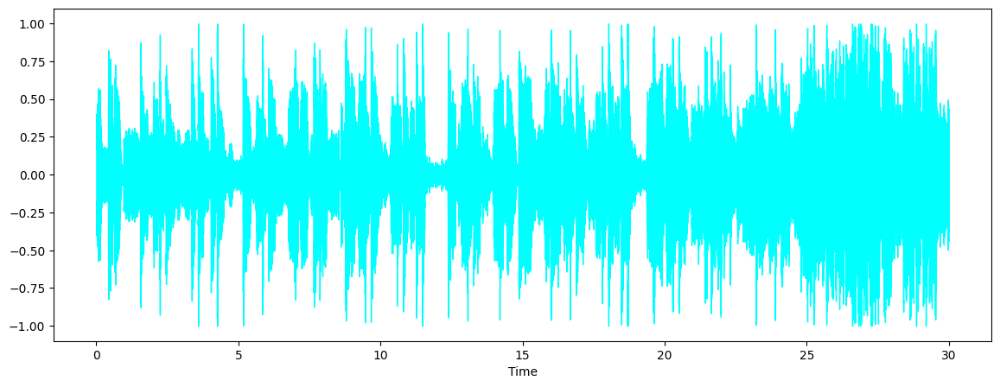

In [67]:
plt.figure(figsize=(14, 5))
x, sr = librosa.load('dataset/genres_original/pop/pop.00000.wav')
librosa.display.waveshow(x, sr=sr,color='cyan')

print("Pop")
IPython.display.display(IPython.display.Audio("dataset/genres_original/pop/pop.00000.wav"))

In [68]:
base_dir = 'dataset/genres_original'

In [12]:
data = []

In [51]:
for genre in sorted(os.listdir(base_dir)):
    genre_dir = os.path.join(base_dir, genre)
    for filename in tqdm(os.listdir(genre_dir), desc=genre):
        file_path = os.path.join(genre_dir, filename)
        y, sr = librosa.load(file_path, sr=None)
        chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
        rms = librosa.feature.rms(y=y)
        spectral_centroid = librosa.feature.spectral_centroid(y=y, sr=sr)
        spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)
        rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
        zcr = librosa.feature.zero_crossing_rate(y)
        harmony, perceptr = librosa.effects.hpss(y)
        tempo, _ = librosa.beat.beat_track(y=y, sr=sr)
        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)
        features = {
            'filename': filename,
            'length': len(y),
            'genre': genre,
            'chroma_stft_mean': np.mean(chroma_stft),
            'chroma_stft_var': np.var(chroma_stft),
            'rms_mean': np.mean(rms),
            'rms_var': np.var(rms),
            'spectral_centroid_mean': np.mean(spectral_centroid),
            'spectral_centroid_var': np.var(spectral_centroid),
            'spectral_bandwidth_mean': np.mean(spectral_bandwidth),
            'spectral_bandwidth_var': np.var(spectral_bandwidth),
            'rolloff_mean': np.mean(rolloff),
            'rolloff_var': np.var(rolloff),
            'zero_crossing_rate_mean': np.mean(zcr),
            'zero_crossing_rate_var': np.var(zcr),
            'harmony_mean': np.mean(harmony),
            'harmony_var': np.var(harmony),
            'perceptr_mean': np.mean(perceptr),
            'perceptr_var': np.var(perceptr),
            'tempo': tempo[0]
        }
        for i, m in enumerate(mfcc, 1):
            features[f'mfcc{i}_mean'] = np.mean(m)
            features[f'mfcc{i}_var'] = np.var(m)
        data.append(features)

rock: 100%|██████████| 100/100 [01:49<00:00,  1.10s/it]


In [52]:
data

[{'filename': 'blues.00093.wav',
  'length': 661794,
  'genre': 'blues',
  'chroma_stft_mean': 0.37769488,
  'chroma_stft_var': 0.09638859,
  'rms_mean': 0.06586,
  'rms_var': 0.0018039934,
  'spectral_centroid_mean': 570.3499042411772,
  'spectral_centroid_var': 104947.12167592371,
  'spectral_bandwidth_mean': 995.5058534728203,
  'spectral_bandwidth_var': 84704.57755371548,
  'rolloff_mean': 929.3001037739269,
  'rolloff_var': 499972.2079548395,
  'zero_crossing_rate_mean': 0.02169698315448569,
  'zero_crossing_rate_var': 0.00011746860485255436,
  'harmony_mean': 7.6123837e-07,
  'harmony_var': 0.0053168465,
  'perceptr_mean': -0.00010389266,
  'perceptr_var': 0.00023672632,
  'tempo': 58.72691761363637,
  'mfcc1_mean': -350.35263,
  'mfcc1_var': 2656.7532,
  'mfcc2_mean': 169.53174,
  'mfcc2_var': 622.58655,
  'mfcc3_mean': 31.771353,
  'mfcc3_var': 316.68668,
  'mfcc4_mean': 16.71844,
  'mfcc4_var': 213.50075,
  'mfcc5_mean': 28.658941,
  'mfcc5_var': 188.21754,
  'mfcc6_mean': 19.

In [53]:
features_df = pd.DataFrame(data)
csv_filename = 'dataset/audio_features.csv'
features_df.to_csv(csv_filename, index=False)

print(f'CSV file created: {csv_filename}')

CSV file created: dataset/audio_features.csv


In [69]:
df = pd.read_csv('dataset/audio_features.csv')
df.head()

,filename,length,genre,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
0,blues.00093.wav,661794,blues,0.377695,0.096389,0.065860,0.001804,570.349904,104947.121676,995.505853,...,-1.779948,35.267666,-3.709091,34.095890,0.172812,34.522312,2.071619,44.243015,-2.889785,61.440556
1,blues.00087.wav,661794,blues,0.336902,0.094721,0.157941,0.002722,1441.680807,387155.803177,1870.021373,...,4.010105,61.667023,-6.263391,53.535805,0.961118,64.100350,2.012547,68.339220,-5.731016,83.996010
2,blues.00050.wav,661794,blues,0.401009,0.089657,0.182285,0.003976,1945.252523,147430.672691,2081.763030,...,3.006187,33.814700,-8.714562,38.764830,-0.331766,56.964350,-2.987200,42.399000,0.705028,55.644600
3,blues.00044.wav,661794,blues,0.390118,0.086307,0.136209,0.000467,2279.031119,170912.655003,2375.232091,...,12.336352,61.292187,0.017295,73.252700,-0.742492,56.273933,-5.134484,95.952225,3.299462,92.619260
4,blues.00078.wav,661794,blues,0.414227,0.082961,0.257993,0.002730,2333.552482,89801.808188,2227.361074,...,5.044607,24.137114,-11.335097,35.112095,3.172888,30.361067,-4.577332,46.814373,-4.034992,35.241432


In [70]:
df['genre'].value_counts()

genre
blues        100
classical    100
country      100
disco        100
hiphop       100
metal        100
pop          100
reggae       100
rock         100
jazz          99
Name: count, dtype: int64

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5, 24.5, 25.5, 26.5, 27.5]),
 [Text(0, 0.5, 'chroma_stft_mean'),
  Text(0, 1.5, 'rms_mean'),
  Text(0, 2.5, 'spectral_centroid_mean'),
  Text(0, 3.5, 'spectral_bandwidth_mean'),
  Text(0, 4.5, 'rolloff_mean'),
  Text(0, 5.5, 'zero_crossing_rate_mean'),
  Text(0, 6.5, 'harmony_mean'),
  Text(0, 7.5, 'perceptr_mean'),
  Text(0, 8.5, 'mfcc1_mean'),
  Text(0, 9.5, 'mfcc2_mean'),
  Text(0, 10.5, 'mfcc3_mean'),
  Text(0, 11.5, 'mfcc4_mean'),
  Text(0, 12.5, 'mfcc5_mean'),
  Text(0, 13.5, 'mfcc6_mean'),
  Text(0, 14.5, 'mfcc7_mean'),
  Text(0, 15.5, 'mfcc8_mean'),
  Text(0, 16.5, 'mfcc9_mean'),
  Text(0, 17.5, 'mfcc10_mean'),
  Text(0, 18.5, 'mfcc11_mean'),
  Text(0, 19.5, 'mfcc12_mean'),
  Text(0, 20.5, 'mfcc13_mean'),
  Text(0, 21.5, 'mfcc14_mean'),
  Text(0, 22.5, 'mfcc15_mean'),
  Text(0, 23.5, 'mfcc16_mean'),
  Text(0, 24.5, 

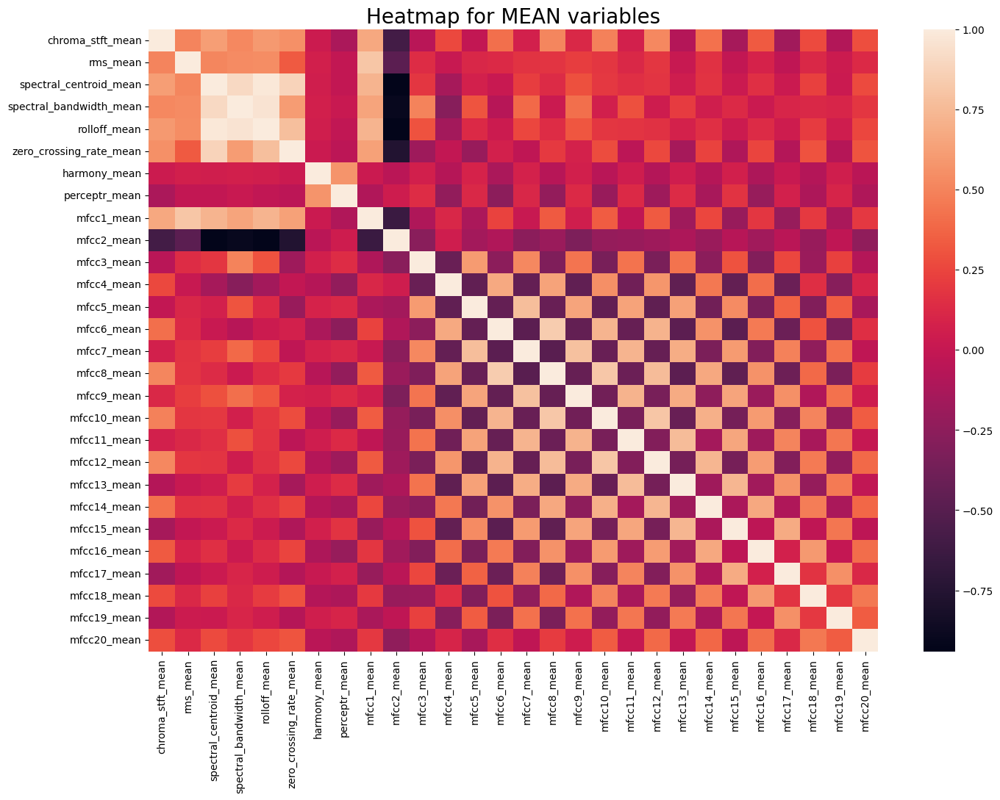

In [71]:
spike_cols = [col for col in df.columns if 'mean' in col]
f, ax = plt.subplots(figsize=(16, 11))
sns.heatmap(df[spike_cols].corr())

plt.title('Heatmap for MEAN variables', fontsize = 20)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)

# Model Implementation

In [150]:
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from joblib import dump, load

## Preprocessing

In [151]:
X = df.drop(['genre','filename', 'length'],axis=1)
y = df['genre']

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
print(label_encoder.classes_)

['blues' 'classical' 'country' 'disco' 'hiphop' 'jazz' 'metal' 'pop'
 'reggae' 'rock']


In [139]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((699, 57), (300, 57), (699,), (300,))

In [140]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## KNN Model

In [141]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train_scaled, y_train)

KNeighborsClassifier()

In [142]:
knn_accuracy = knn_model.score(X_test_scaled, y_test)
print(f"KNN Classifier Accuracy: {knn_accuracy}")

KNN Classifier Accuracy: 0.69


In [143]:
y_pred_knn = knn_model.predict(X_test_scaled)
print(classification_report(y_test, y_pred_knn, target_names=label_encoder.classes_))

              precision    recall  f1-score   support

       blues       0.71      0.63      0.67        27
   classical       0.85      0.88      0.87        33
     country       0.45      0.64      0.53        28
       disco       0.53      0.75      0.62        28
      hiphop       0.61      0.45      0.52        31
        jazz       0.86      0.83      0.85        30
       metal       0.89      0.81      0.85        31
         pop       0.67      0.74      0.70        27
      reggae       0.73      0.55      0.63        29
        rock       0.73      0.61      0.67        36

    accuracy                           0.69       300
   macro avg       0.70      0.69      0.69       300
weighted avg       0.71      0.69      0.69       300



In [144]:
dump(knn_model, 'knn_model.joblib')
print(f'KNN model saved')

KNN model saved


## XGBoost

In [145]:
xgb_model = XGBClassifier(n_estimators=2000,use_label_encoder=False, eval_metric='mlogloss')
xgb_model.fit(X_train_scaled, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=2000,
              n_jobs=None, num_parallel_tree=None, objective='multi:softprob', ...)

In [146]:
xgb_accuracy = xgb_model.score(X_test_scaled, y_test)
print(f"XGBoost Classifier Accuracy: {xgb_accuracy}")

XGBoost Classifier Accuracy: 0.73


In [148]:
y_pred_xgb = xgb_model.predict(X_test_scaled)
print(classification_report(y_test, y_pred_xgb, target_names=label_encoder.classes_))

              precision    recall  f1-score   support

       blues       0.65      0.74      0.69        27
   classical       0.97      0.94      0.95        33
     country       0.62      0.64      0.63        28
       disco       0.55      0.57      0.56        28
      hiphop       0.75      0.68      0.71        31
        jazz       0.88      0.93      0.90        30
       metal       0.76      0.94      0.84        31
         pop       0.77      0.85      0.81        27
      reggae       0.64      0.62      0.63        29
        rock       0.65      0.42      0.51        36

    accuracy                           0.73       300
   macro avg       0.72      0.73      0.72       300
weighted avg       0.73      0.73      0.72       300



In [147]:
dump(xgb_model, 'xgb_model.joblib')
print(f'XGBoost model saved')

XGBoost model saved


## Dense Layer Neural Network

In [47]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import classification_report

In [48]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(512, activation='relu', input_shape=(X_train_scaled.shape[1],)),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.4),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(len(label_encoder.classes_), activation='softmax')
])

/Users/vaibhav/Desktop/MusicGenre/mgc/lib/python3.9/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [49]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 512)            │        29,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 178,122 (695.79 KB)

 Trainable params: 178,122 (695.79 KB)

 Non-trainable params: 0 (0.00 B)

In [81]:
opt = Adam(learning_rate=1e-4)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [82]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)

In [83]:
history = model.fit(
    X_train_scaled, 
    y_train, 
    epochs=100, 
    batch_size=16,
    validation_data=(X_test_scaled, y_test),
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - accuracy: 0.2125 - loss: 2.1294 - val_accuracy: 0.5433 - val_loss: 1.3332 - learning_rate: 0.0010
Epoch 2/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.4676 - loss: 1.4057 - val_accuracy: 0.6033 - val_loss: 1.0865 - learning_rate: 0.0010
Epoch 3/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5855 - loss: 1.1479 - val_accuracy: 0.6700 - val_loss: 0.9603 - learning_rate: 0.0010
Epoch 4/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6739 - loss: 0.9879 - val_accuracy: 0.6800 - val_loss: 0.8769 - learning_rate: 0.0010
Epoch 5/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6800 - loss: 0.8986 - val_accuracy: 0.7167 - val_loss: 0.7876 - learning_rate: 0.0010
Epoch 6/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7358 - loss: 0.7724 - val_accuracy: 0.7267 - val_loss: 0.7614 - learning_rate: 0.0010
Epoch 7/100
44/44 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.7332 - loss: 0.7069 - val_ac

In [78]:
test_loss, test_acc = model.evaluate(X_test_scaled, y_test, verbose=2)
print(f"Test accuracy: {test_acc}")

10/10 - 0s - 7ms/step - accuracy: 0.7600 - loss: 0.7191
Test accuracy: 0.7599999904632568


In [207]:
y_pred_prob = model.predict(X_test_scaled)
y_pred = np.argmax(y_pred_prob, axis=1)

 1/10 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


In [208]:
report = classification_report(y_test, y_pred, target_names=label_encoder.classes_)
print(report)

              precision    recall  f1-score   support

       blues       0.75      0.93      0.83        29
   classical       0.98      0.95      0.96        42
     country       0.64      0.69      0.67        26
       disco       0.67      0.59      0.63        27
      hiphop       0.83      0.77      0.80        31
        jazz       0.93      0.93      0.93        28
       metal       0.92      0.86      0.89        28
         pop       0.85      0.90      0.88        31
      reggae       0.68      0.54      0.60        28
        rock       0.58      0.63      0.60        30

    accuracy                           0.79       300
   macro avg       0.78      0.78      0.78       300
weighted avg       0.79      0.79      0.79       300



In [210]:
model.save('densenet.keras')

In [212]:
sample_index = 12 
sample_features = X_test_scaled[sample_index]
true_label_index = y_test[sample_index]
true_label = label_encoder.inverse_transform([true_label_index])
sample_features_reshaped = sample_features.reshape(1, -1)

predicted_probabilities = model.predict(sample_features_reshaped)
predicted_label_index = np.argmax(predicted_probabilities, axis=1)
predicted_label = label_encoder.inverse_transform(predicted_label_index)

print(f"Sample Features (first 5 values): {sample_features[:5]}")
print(f"True Label: {true_label[0]}")
print(f"Predicted Label: {predicted_label[0]}")
print(f"Prediction Probabilities: {predicted_probabilities.flatten()}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Sample Features (first 5 values): [-0.59951498 -0.03083268  1.03257645  1.12330959  0.85763563]
True Label: pop
Predicted Label: pop
Prediction Probabilities: [2.7075255e-06 2.5272752e-06 2.0333001e-04 4.5296261e-03 1.5025737e-04
 2.4318120e-05 2.4417525e-06 9.9350536e-01 7.0267495e-05 1.5091965e-03]


## CNN Using Spectrogram

In [152]:
def plot_spectrogram(file):
    y, sr = librosa.load(f'dataset/genres_original/{file}/{file}.00000.wav')
    ft = np.abs(librosa.stft(y, n_fft=2048,  hop_length=512))
    ft_dB = librosa.amplitude_to_db(ft, ref=np.max)
    plt.figure(figsize=(7, 5))
    librosa.display.specshow(ft_dB, sr=sr, hop_length=512, x_axis='time', y_axis='log')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()
    print(file)

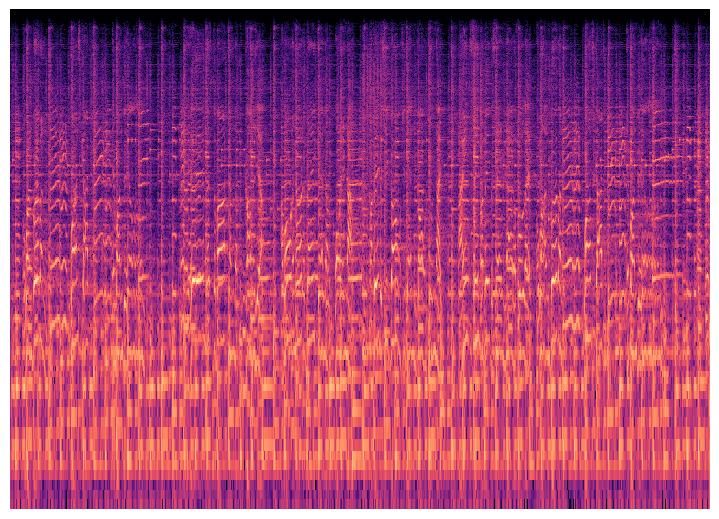

blues


In [153]:
plot_spectrogram('blues')

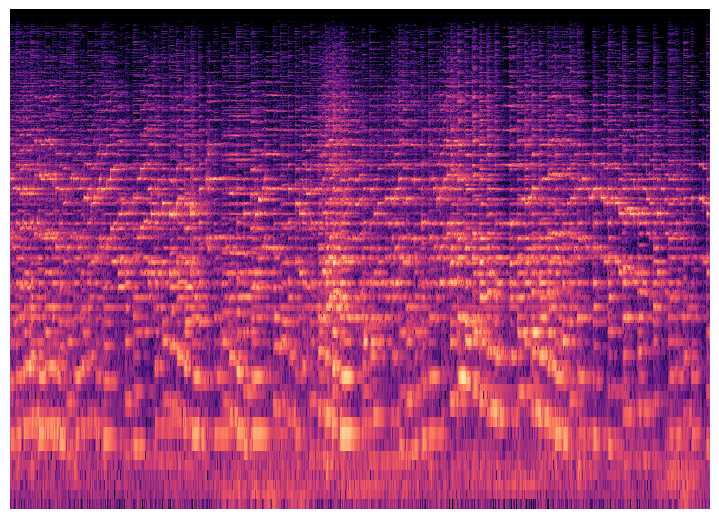

classical


In [154]:
plot_spectrogram('classical')

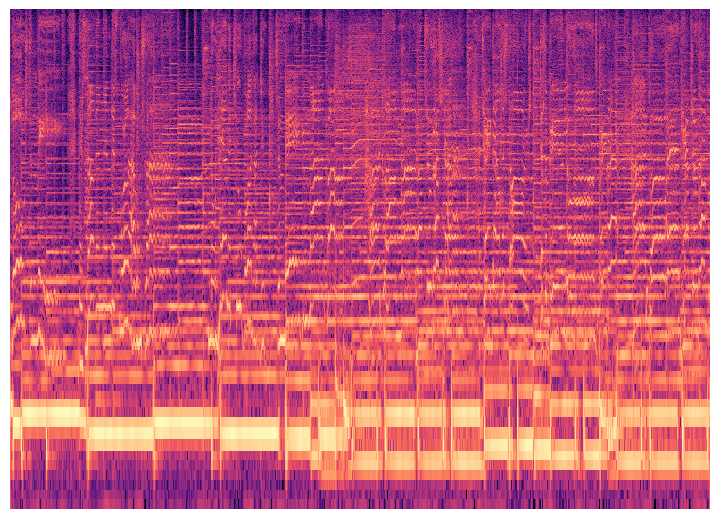

country


In [155]:
plot_spectrogram('country')

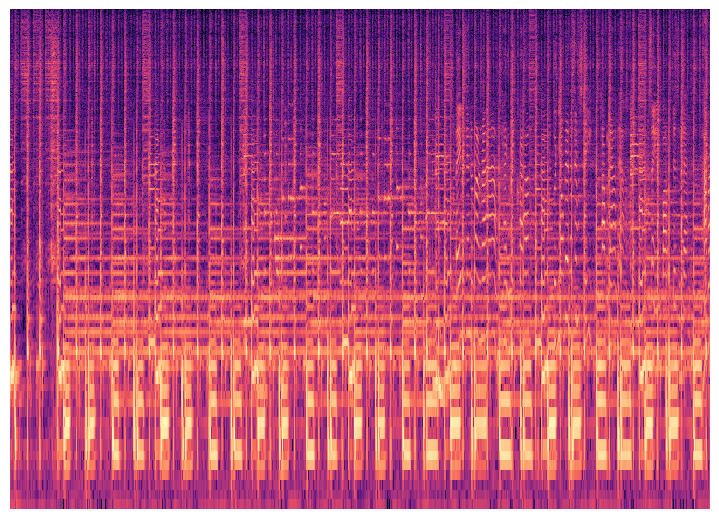

disco


In [156]:
plot_spectrogram('disco')

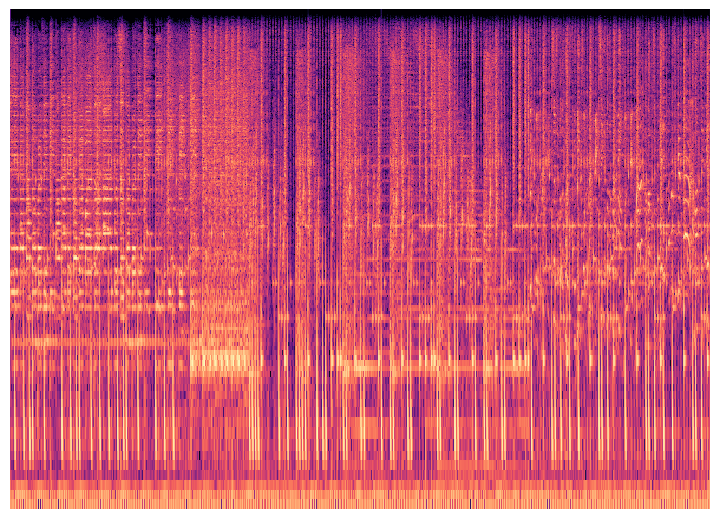

hiphop


In [157]:
plot_spectrogram('hiphop')

In [ ]:
import os
from tqdm import tqdm

path='dataset/genres_original/'
specimgpath = 'dataset/spectrogram_images/'

print('Generating Spectrogram Images from .wav files')
for genre in sorted(os.listdir(f'{path}/')):
    os.makedirs(f'{specimgpath}/{genre}', exist_ok=True)
    for img in tqdm(sorted(os.listdir(f'{path}/{genre}')), desc=genre):
        imgparts = img.split('.')
        imgname = f'{os.path.join(specimgpath,genre)}/{imgparts[0]}{imgparts[1]}.png'
        try:
            y,sr = librosa.load(os.path.join(path,genre,img))
            ft = np.abs(librosa.stft(y, n_fft=2048,  hop_length=512))
            ft_dB = librosa.amplitude_to_db(ft, ref=np.max)
            librosa.display.specshow(ft_dB, sr=sr, hop_length=512, x_axis='time', y_axis='log')
            plt.axis('off')
            plt.tight_layout(pad=0)
            plt.savefig(imgname)
            plt.close()
        except:
            continue
print('Done.......')

In [158]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG19
from tensorflow.keras import layers, models, optimizers, callbacks

In [159]:
base_dir = 'dataset/spectrogram_images/'

In [160]:
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.1)

In [161]:
train_generator = train_datagen.flow_from_directory(
    base_dir,
    target_size=(224, 224),
    batch_size=20,
    class_mode='categorical',
    subset='training')

Found 900 images belonging to 10 classes.


In [162]:
validation_generator = train_datagen.flow_from_directory(
    base_dir,
    target_size=(224, 224),
    batch_size=20,
    class_mode='categorical',
    subset='validation')

Found 99 images belonging to 10 classes.


In [163]:
base_model = VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [164]:
for layer in base_model.layers:
    layer.trainable = False

In [165]:
vggmodel = models.Sequential()
vggmodel.add(base_model)
vggmodel.add(layers.Flatten())
vggmodel.add(layers.Dense(512, activation='relu'))
# vggmodel.add(layers.Dropout(0.5))
vggmodel.add(layers.Dense(256, activation='relu'))
vggmodel.add(layers.Dense(128, activation='relu'))
vggmodel.add(layers.Dense(64, activation='relu'))
vggmodel.add(layers.Dense(len(train_generator.class_indices), activation='softmax'))

In [166]:
optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.0001)
vggmodel.compile(loss='categorical_crossentropy',optimizer=optimizer,metrics=['acc'])

In [167]:
early_stopping = callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1, mode='min', restore_best_weights=True)
reduce_lr = callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=2, verbose=1, mode='min', min_lr=0.00001)

In [168]:
history = vggmodel.fit(train_generator, steps_per_epoch=100, epochs=100, validation_data=validation_generator,validation_steps=50, callbacks=[early_stopping, reduce_lr], verbose=1)

Epoch 1/100


/Users/vaibhav/Desktop/MusicGenre/mgc/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


 45/100 ━━━━━━━━━━━━━━━━━━━━ 9s 181ms/step - acc: 0.1638 - loss: 2.2722 

2024-05-08 22:46:08.604244: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:46:08.604259: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/rmsprop/add_20/_6]]
2024-05-08 22:46:08.604269: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:46:08.604279: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 13655199123345075420
2024-05-08 22:46:08.604283: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6257030446044645208
/Applications/Xcode.app/Contents/Developer/Library/Frameworks/Python3.framework/Versions/3.9/lib/python3.9/contextlib.py:135: UserWarnin

100/100 ━━━━━━━━━━━━━━━━━━━━ 12s 98ms/step - acc: 0.1947 - loss: 2.2084 - val_acc: 0.3737 - val_loss: 1.9704 - learning_rate: 1.0000e-04
Epoch 2/100


2024-05-08 22:46:10.269402: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:46:10.269423: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:46:10.269426: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_10]]
2024-05-08 22:46:10.269438: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:46:10.269443: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6238073757695657854


 45/100 ━━━━━━━━━━━━━━━━━━━━ 9s 179ms/step - acc: 0.3916 - loss: 1.7698 

2024-05-08 22:46:19.786366: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:46:19.786386: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_14]]
2024-05-08 22:46:19.786396: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7910031364055590714
2024-05-08 22:46:19.786420: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:46:19.786425: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 8204584459519783604
2024-05-08 22:46:19.786429: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 13655199123345075420
2024-05-0

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - acc: 0.3981 - loss: 1.7456 - val_acc: 0.4747 - val_loss: 1.5815 - learning_rate: 1.0000e-04
Epoch 3/100


2024-05-08 22:46:20.865448: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:46:20.865466: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:46:20.865471: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[ArgMax_1/_14]]
2024-05-08 22:46:20.865483: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:46:20.865488: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 13050556851838083232
2024-05-08 22:46:20.865494: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6238073757695657854


 45/100 ━━━━━━━━━━━━━━━━━━━━ 10s 186ms/step - acc: 0.4920 - loss: 1.4947

2024-05-08 22:46:30.715110: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:46:30.715125: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/rmsprop/add_20/_6]]
2024-05-08 22:46:30.715135: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:46:30.715146: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 13655199123345075420
2024-05-08 22:46:30.715150: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6257030446044645208


100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 95ms/step - acc: 0.5007 - loss: 1.4778 - val_acc: 0.4848 - val_loss: 1.4883 - learning_rate: 1.0000e-04
Epoch 4/100


2024-05-08 22:46:31.850765: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:46:31.850786: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6238073757695657854
2024-05-08 22:46:31.850791: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_10]]
2024-05-08 22:46:31.850795: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 15027010427994459117
2024-05-08 22:46:31.850799: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:46:31.850802: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 9430065380464526897
2024-05-0

 45/100 ━━━━━━━━━━━━━━━━━━━━ 10s 184ms/step - acc: 0.5730 - loss: 1.2529

2024-05-08 22:46:41.602493: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:46:41.602508: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/rmsprop/add_20/_6]]
2024-05-08 22:46:41.602519: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:46:41.602528: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 13655199123345075420
2024-05-08 22:46:41.602533: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6257030446044645208


100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - acc: 0.5750 - loss: 1.2540 - val_acc: 0.4141 - val_loss: 1.4871 - learning_rate: 1.0000e-04
Epoch 5/100


2024-05-08 22:46:42.669849: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:46:42.669862: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[Shape/_4]]
2024-05-08 22:46:42.669870: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 15027010427994459117
2024-05-08 22:46:42.669873: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:46:42.669876: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 9430065380464526897
2024-05-08 22:46:42.669884: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:46:42.

 45/100 ━━━━━━━━━━━━━━━━━━━━ 10s 183ms/step - acc: 0.6388 - loss: 1.1307

2024-05-08 22:46:52.354996: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:46:52.355010: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:46:52.355015: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/rmsprop/add_20/_6]]
2024-05-08 22:46:52.355029: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 13655199123345075420
2024-05-08 22:46:52.355040: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6257030446044645208


100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - acc: 0.6279 - loss: 1.1305 - val_acc: 0.5960 - val_loss: 1.2512 - learning_rate: 1.0000e-04
Epoch 6/100


2024-05-08 22:46:53.439771: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:46:53.439783: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[Shape/_4]]
2024-05-08 22:46:53.439789: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 15027010427994459117
2024-05-08 22:46:53.439792: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:46:53.439795: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 9430065380464526897
2024-05-08 22:46:53.439799: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:46:53.

 45/100 ━━━━━━━━━━━━━━━━━━━━ 10s 184ms/step - acc: 0.6228 - loss: 1.0549

2024-05-08 22:47:03.190893: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_4]]
2024-05-08 22:47:03.190908: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:47:03.190921: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:47:03.190932: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6257030446044645208


100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - acc: 0.6274 - loss: 1.0461 - val_acc: 0.5960 - val_loss: 1.2230 - learning_rate: 1.0000e-04
Epoch 7/100


2024-05-08 22:47:04.261222: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:47:04.261241: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:47:04.261250: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
2024-05-08 22:47:04.261262: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 15027010427994459117
2024-05-08 22:47:04.261266: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 13050556851838083232
2024-05-08 22:47:04.261273: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6238073757695657854
2024-05-0

 45/100 ━━━━━━━━━━━━━━━━━━━━ 10s 182ms/step - acc: 0.6853 - loss: 0.9601

2024-05-08 22:47:13.902998: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_4]]
2024-05-08 22:47:13.903019: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:47:13.903025: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6257030446044645208
2024-05-08 22:47:13.903028: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]


100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - acc: 0.6873 - loss: 0.9482 - val_acc: 0.5354 - val_loss: 1.2995 - learning_rate: 1.0000e-04
Epoch 8/100


2024-05-08 22:47:15.035744: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:47:15.035767: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:47:15.035772: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
2024-05-08 22:47:15.035784: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 15027010427994459117
2024-05-08 22:47:15.035788: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 13050556851838083232
2024-05-08 22:47:15.035796: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6238073757695657854
2024-05-0

 45/100 ━━━━━━━━━━━━━━━━━━━━ 10s 183ms/step - acc: 0.7151 - loss: 0.8578

2024-05-08 22:47:24.697515: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:47:24.697531: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/ArgMax/_10]]
2024-05-08 22:47:24.697545: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7910031364055590714
2024-05-08 22:47:24.697556: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:47:24.697561: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 8204584459519783604
2024-05-08 22:47:24.697564: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 136551991233450


Epoch 8: ReduceLROnPlateau reducing learning rate to 1e-05.
100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - acc: 0.7166 - loss: 0.8644 - val_acc: 0.4949 - val_loss: 1.3505 - learning_rate: 1.0000e-04
Epoch 9/100


2024-05-08 22:47:25.860510: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:47:25.860529: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_10]]
2024-05-08 22:47:25.860541: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:47:25.860550: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:47:25.860557: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6238073757695657854


 45/100 ━━━━━━━━━━━━━━━━━━━━ 10s 185ms/step - acc: 0.7873 - loss: 0.7037

2024-05-08 22:47:35.662948: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:47:35.662960: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/rmsprop/add_20/_6]]
2024-05-08 22:47:35.662966: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 11519179527080868881
2024-05-08 22:47:35.662971: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6538386258437660383
2024-05-08 22:47:35.662977: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7910031364055590714
2024-05-08 22:47:35.662980: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - acc: 0.8035 - loss: 0.6824 - val_acc: 0.6364 - val_loss: 1.1372 - learning_rate: 1.0000e-05
Epoch 10/100


2024-05-08 22:47:36.728270: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:47:36.728285: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[Shape/_4]]
2024-05-08 22:47:36.728295: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 15027010427994459117
2024-05-08 22:47:36.728299: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:47:36.728302: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 9430065380464526897
2024-05-08 22:47:36.728307: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:47:36.

 45/100 ━━━━━━━━━━━━━━━━━━━━ 10s 183ms/step - acc: 0.8187 - loss: 0.6646

2024-05-08 22:47:46.453178: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:47:46.453192: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/ArgMax/_10]]
2024-05-08 22:47:46.453203: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7910031364055590714
2024-05-08 22:47:46.453212: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:47:46.453216: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 8204584459519783604
2024-05-08 22:47:46.453218: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 136551991233450

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - acc: 0.8219 - loss: 0.6516 - val_acc: 0.6162 - val_loss: 1.1393 - learning_rate: 1.0000e-05
Epoch 11/100


2024-05-08 22:47:47.559966: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:47:47.559983: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[Shape/_4]]
2024-05-08 22:47:47.559990: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 15027010427994459117
2024-05-08 22:47:47.559994: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:47:47.559997: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 9430065380464526897
2024-05-08 22:47:47.560001: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:47:47.

 45/100 ━━━━━━━━━━━━━━━━━━━━ 10s 182ms/step - acc: 0.8466 - loss: 0.6164

2024-05-08 22:47:57.200537: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:47:57.200550: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/rmsprop/add_20/_6]]
2024-05-08 22:47:57.200560: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 11519179527080868881
2024-05-08 22:47:57.200576: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6538386258437660383
2024-05-08 22:47:57.200585: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7910031364055590714
2024-05-08 22:47:57.200589: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - acc: 0.8387 - loss: 0.6222 - val_acc: 0.6061 - val_loss: 1.1453 - learning_rate: 1.0000e-05
Epoch 12/100


2024-05-08 22:47:58.277146: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:47:58.277164: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:47:58.277169: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_10]]
2024-05-08 22:47:58.277192: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:47:58.277197: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6238073757695657854


 45/100 ━━━━━━━━━━━━━━━━━━━━ 9s 178ms/step - acc: 0.8249 - loss: 0.6315

2024-05-08 22:48:07.681296: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:48:07.681311: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:48:07.681317: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_4]]
2024-05-08 22:48:07.681330: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6257030446044645208


100/100 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - acc: 0.8289 - loss: 0.6224 - val_acc: 0.6364 - val_loss: 1.1337 - learning_rate: 1.0000e-05
Epoch 13/100


2024-05-08 22:48:08.735383: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:48:08.735402: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:48:08.735407: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6238073757695657854
2024-05-08 22:48:08.735412: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_10]]
2024-05-08 22:48:08.735425: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587


 45/100 ━━━━━━━━━━━━━━━━━━━━ 9s 179ms/step - acc: 0.8468 - loss: 0.6113 

2024-05-08 22:48:18.250613: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:48:18.250629: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:48:18.250634: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/rmsprop/add_20/_6]]
2024-05-08 22:48:18.250644: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 13655199123345075420
2024-05-08 22:48:18.250654: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6257030446044645208


100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 90ms/step - acc: 0.8431 - loss: 0.6069 - val_acc: 0.6061 - val_loss: 1.1288 - learning_rate: 1.0000e-05
Epoch 14/100


2024-05-08 22:48:19.281621: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:48:19.281638: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:48:19.281644: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_10]]
2024-05-08 22:48:19.281656: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:48:19.281664: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6238073757695657854


 45/100 ━━━━━━━━━━━━━━━━━━━━ 9s 181ms/step - acc: 0.8290 - loss: 0.6054 

2024-05-08 22:48:28.831776: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:48:28.831789: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_14]]
2024-05-08 22:48:28.831802: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7910031364055590714
2024-05-08 22:48:28.831809: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:48:28.831813: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 8204584459519783604
2024-05-08 22:48:28.831816: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 13655199123345075420
2024-05-0

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - acc: 0.8363 - loss: 0.5974 - val_acc: 0.6364 - val_loss: 1.1036 - learning_rate: 1.0000e-05
Epoch 15/100


2024-05-08 22:48:29.876043: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:48:29.876057: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[Shape/_4]]
2024-05-08 22:48:29.876067: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 15027010427994459117
2024-05-08 22:48:29.876071: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:48:29.876074: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 9430065380464526897
2024-05-08 22:48:29.876078: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:48:29.

 45/100 ━━━━━━━━━━━━━━━━━━━━ 10s 182ms/step - acc: 0.8468 - loss: 0.5921

2024-05-08 22:48:39.476046: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:48:39.476064: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/ArgMax/_10]]
2024-05-08 22:48:39.476078: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7910031364055590714
2024-05-08 22:48:39.476086: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:48:39.476090: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 8204584459519783604
2024-05-08 22:48:39.476094: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 136551991233450

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - acc: 0.8474 - loss: 0.5876 - val_acc: 0.6364 - val_loss: 1.1061 - learning_rate: 1.0000e-05
Epoch 16/100


2024-05-08 22:48:40.572695: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:48:40.572713: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:48:40.572723: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 13050556851838083232
2024-05-08 22:48:40.572728: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[ArgMax_1/_14]]
2024-05-08 22:48:40.572739: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:48:40.572743: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6238073757695657854


 45/100 ━━━━━━━━━━━━━━━━━━━━ 10s 182ms/step - acc: 0.8431 - loss: 0.5743

2024-05-08 22:48:50.189794: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:48:50.189807: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/rmsprop/add_20/_6]]
2024-05-08 22:48:50.189813: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 11519179527080868881
2024-05-08 22:48:50.189818: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6538386258437660383
2024-05-08 22:48:50.189824: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7910031364055590714
2024-05-08 22:48:50.189828: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - acc: 0.8487 - loss: 0.5742 - val_acc: 0.6162 - val_loss: 1.1121 - learning_rate: 1.0000e-05
Epoch 17/100


2024-05-08 22:48:51.277663: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:48:51.277677: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[Shape/_4]]
2024-05-08 22:48:51.277684: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 15027010427994459117
2024-05-08 22:48:51.277688: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:48:51.277691: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 9430065380464526897
2024-05-08 22:48:51.277695: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:48:51.

 45/100 ━━━━━━━━━━━━━━━━━━━━ 10s 182ms/step - acc: 0.8634 - loss: 0.5635

2024-05-08 22:49:00.917927: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:49:00.917942: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/ArgMax/_10]]
2024-05-08 22:49:00.917957: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7910031364055590714
2024-05-08 22:49:00.917964: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:49:00.917969: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 8204584459519783604
2024-05-08 22:49:00.917972: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 136551991233450

100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - acc: 0.8652 - loss: 0.5618 - val_acc: 0.6162 - val_loss: 1.1305 - learning_rate: 1.0000e-05
Epoch 18/100


2024-05-08 22:49:01.978148: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:49:01.978169: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_10]]
2024-05-08 22:49:01.978183: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:49:01.978190: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:49:01.978197: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6238073757695657854


 45/100 ━━━━━━━━━━━━━━━━━━━━ 10s 182ms/step - acc: 0.8602 - loss: 0.5488

2024-05-08 22:49:11.577419: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:49:11.577433: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[StatefulPartitionedCall/rmsprop/add_20/_6]]
2024-05-08 22:49:11.577445: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:49:11.577456: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 13655199123345075420
2024-05-08 22:49:11.577462: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6257030446044645208


100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - acc: 0.8625 - loss: 0.5525 - val_acc: 0.6364 - val_loss: 1.1268 - learning_rate: 1.0000e-05
Epoch 19/100


2024-05-08 22:49:12.605287: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:49:12.605305: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[Shape/_4]]
2024-05-08 22:49:12.605319: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 15027010427994459117
2024-05-08 22:49:12.605322: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:49:12.605325: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 9430065380464526897
2024-05-08 22:49:12.605329: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:49:12.

 45/100 ━━━━━━━━━━━━━━━━━━━━ 9s 181ms/step - acc: 0.8883 - loss: 0.5184 

2024-05-08 22:49:22.120076: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:49:22.120090: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_4]]
2024-05-08 22:49:22.120103: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 5319655406110331312
2024-05-08 22:49:22.120109: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6257030446044645208


100/100 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step - acc: 0.8801 - loss: 0.5320 - val_acc: 0.6263 - val_loss: 1.1162 - learning_rate: 1.0000e-05
Epoch 19: early stopping
Restoring model weights from the end of the best epoch: 14.


2024-05-08 22:49:23.170328: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:49:23.170350: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:49:23.170356: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[ArgMax/_6]]
2024-05-08 22:49:23.170368: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6238073757695657854


In [173]:
test_loss, test_acc = vggmodel.evaluate(validation_generator, steps=50)
print('Test accuracy for CNN:', test_acc)

50/50 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - acc: 0.6375 - loss: 1.1006 
Test accuracy for CNN: 0.6363636255264282


2024-05-08 22:56:44.036467: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2024-05-08 22:56:44.036482: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_10]]
2024-05-08 22:56:44.036495: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 3296074613556873204
2024-05-08 22:56:44.036501: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 7542232552394513587
2024-05-08 22:56:44.036511: I tensorflow/core/framework/local_rendezvous.cc:422] Local rendezvous recv item cancelled. Key hash: 6238073757695657854
/Applications/Xcode.app/Contents/Developer/Library/Frameworks/Python3.framework/Versions/3.9/lib/python3.9/contextlib.py:135: UserWarning: Your input ran out o

In [179]:
y_pred_prob = vggmodel.predict(validation_generator)
y_pred = np.argmax(y_pred_prob, axis=1)
report = classification_report(validation_generator.classes, y_pred, target_names=label_encoder.classes_)
print(report)

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step
              precision    recall  f1-score   support

       blues       0.12      0.10      0.11        10
   classical       0.15      0.20      0.17        10
     country       0.00      0.00      0.00        10
       disco       0.00      0.00      0.00        10
      hiphop       0.22      0.20      0.21        10
        jazz       0.00      0.00      0.00         9
       metal       0.22      0.20      0.21        10
         pop       0.14      0.10      0.12        10
      reggae       0.15      0.20      0.17        10
        rock       0.13      0.20      0.16        10

    accuracy                           0.12        99
   macro avg       0.12      0.12      0.12        99
weighted avg       0.12      0.12      0.12        99



In [31]:
vggmodel.save('vggnet.keras')